<a href="https://colab.research.google.com/github/elhassn/AI_QA_PDF_Colab_Notebook/blob/main/Prompt_Engineering_for_Speech_and_Image_Case_Study_Coding_Track.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Prompt Engineering for Speech and Image Case Study**

### **Business Context**

Traditional news consumption is declining among younger audiences, who prefer visual, bite-sized content over long articles. Social media has fueled the popularity of memes, short videos, and comics as alternative news formats.
ComicNews, a digital media startup, aims to revolutionize news delivery by converting daily headlines into comical, illustrated summaries. These engaging visuals help audiences quickly grasp key events in an entertaining way.

To achieve this, ComicNews automates the process by using AI-powered speech-to-text, Article and image generation to transform raw news audio into a comical, single-panel or multi-panel illustrated news piece.



### **Problem Statement**

* Traditional news formats struggle to retain audience engagement.
* Manual cartoon creation for news is slow and resource-intensive.
* Extracting relevant news insights from long videos/podcasts is difficult.
* Viral meme-like content requires speed—delays make news irrelevant.

**ComicNews needs a fast, scalable solution that can:**
  * Extract information from open-source audio
  * Generate engaging, humorous comic-style illustrations with AI.
  * Ensure content is accurate, visually appealing, and shareable.


### **Objective**

* Automate news-to-comic generation using AI-powered transcription, Article creation, and image creation.
* Create highly engaging, humorous visual news Article that capture key events in a funny, meme-like format.
* Increase audience retention and social media virality by making news consumption more interactive.
* Reduce manual effort and production time while maintaining accuracy and creativity.


### Installing Necessary Libraries

* pydub:	Manipulates audio files, like converting formats and trimming.
* ffmpeg:	A command-line tool for processing multimedia files (audio and video).
* azure-cognitiveservices-speech:	Allows interaction with Azure's Speech service for speech recognition.
* openai:	Enables interaction with OpenAI's language models (like GPT-3 or GPT-4).
* tiktoken:	Breaks down text into tokens for use with language models.


In [2]:
# Install necessary libraries
!pip install pydub
!apt-get install -y ffmpeg
!pip install azure-cognitiveservices-speech
!pip install openai==1.55.3 tiktoken

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 MB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.6/389.6 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 36.4 MB/s eta 0:00:00
  Attempting uninstall: openai
    Found existing installation: openai 1.76.0
    Uninstalling openai-1.76.0:
      Successfully uninstalled openai-1.76.0


* **from pydub import AudioSegment:** Imports the AudioSegment tool from the pydub library. This is used for working with audio files, such as reading, trimming, and converting them.

* **import requests**: Imports the requests library, which is used for making HTTP requests, in simpler words, for downloading files from the internet.

* **import json:** This is for working with data in JSON format, which is a common way to store and exchange data.

* **import os:** Provides functions for interacting with your computer's operating system, like creating or deleting files.

* **import azure.cognitiveservices.speech as speechsdk:** This import enables the code to talk to Azure's speech services, like converting speech to text.

* **from openai import AzureOpenAI:** Imports tools for working with OpenAI's Azure service, this is commonly used for powerful language models.

* **import tiktoken:** This library helps in counting tokens in text, which is important when working with language models.

* **import openai:** This imports the main OpenAI library, providing access to their APIs.

* **import textwrap:** This is a utility for formatting text, like wrapping long lines.

* **import httpx:** This is an advanced HTTP client for making requests, similar to requests, but with more features.

* **from PIL import Image:** Used for working with images, opening, manipulating, and saving them.

* **from IPython.display import display Markdown:** Imports tools to display outputs (like text or images) nicely within a Jupyter Notebook. Markdown is specifically for formatting text.

In [1]:
# Import necessary libraries
from pydub import AudioSegment
import requests
import json
import os
import azure.cognitiveservices.speech as speechsdk
from openai import AzureOpenAI
import tiktoken
import openai
import re
import textwrap
import httpx
from PIL import Image
from IPython.display import display, Markdown


ModuleNotFoundError: No module named 'pydub'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#### **Requirements**

#### **Get 4o-mini endpoint**

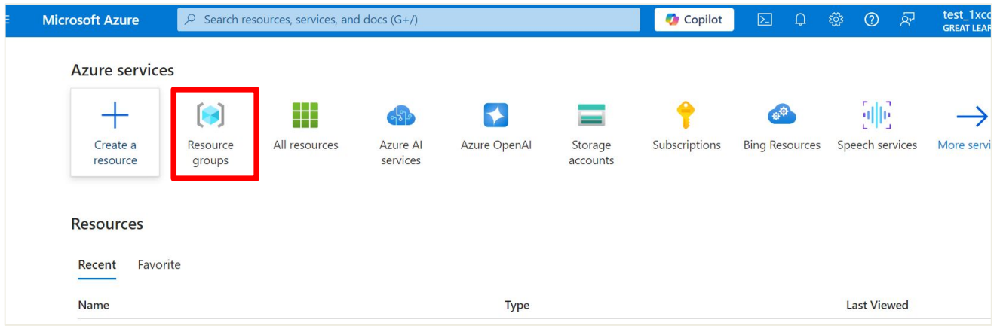

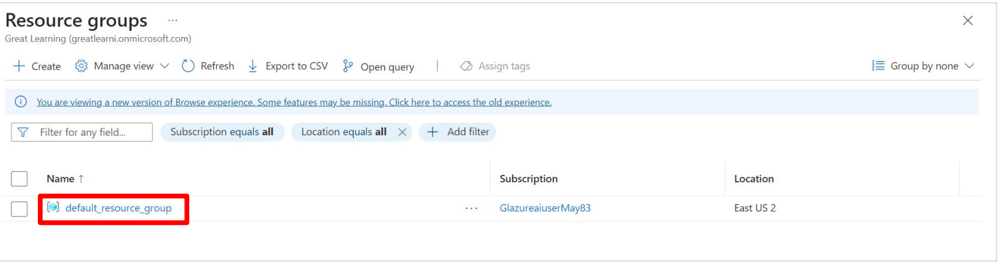

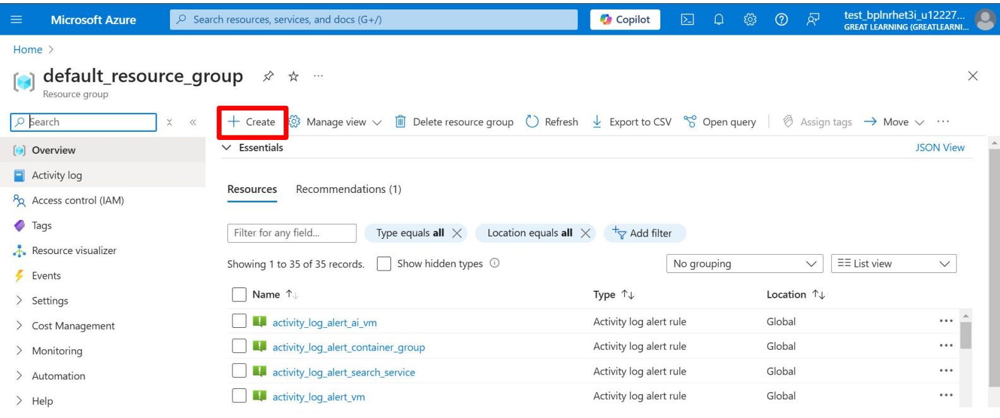

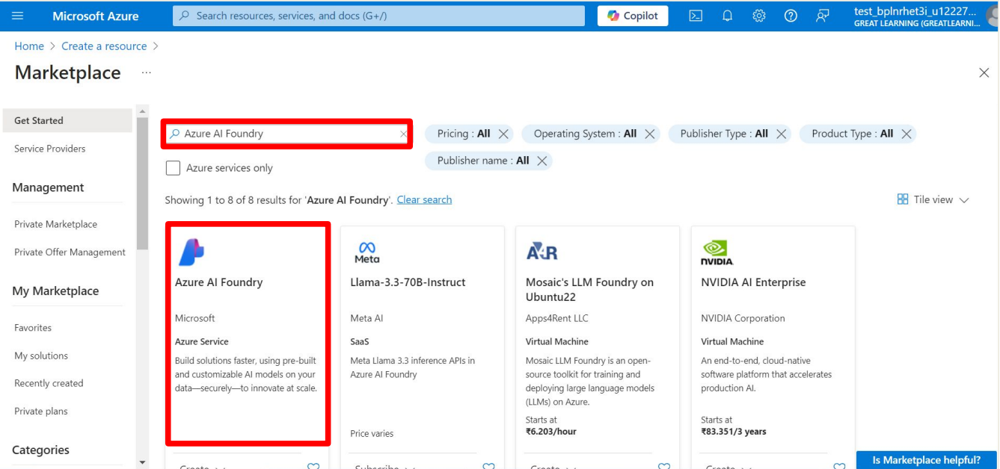

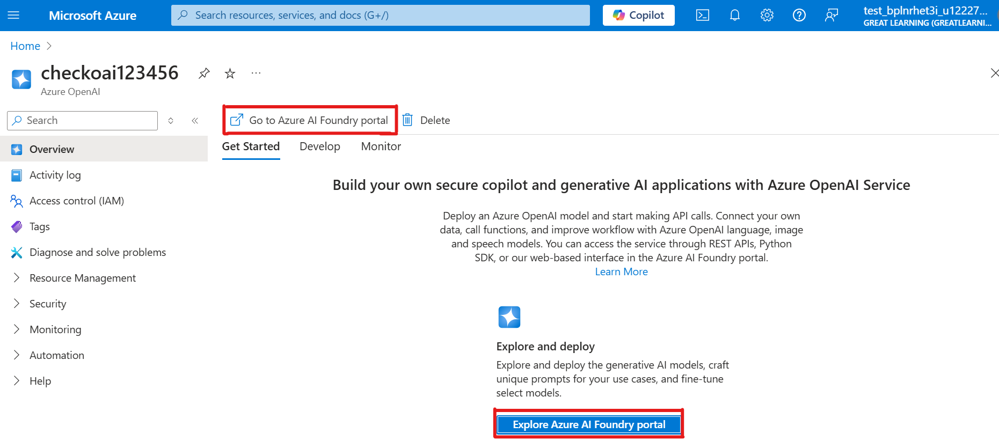

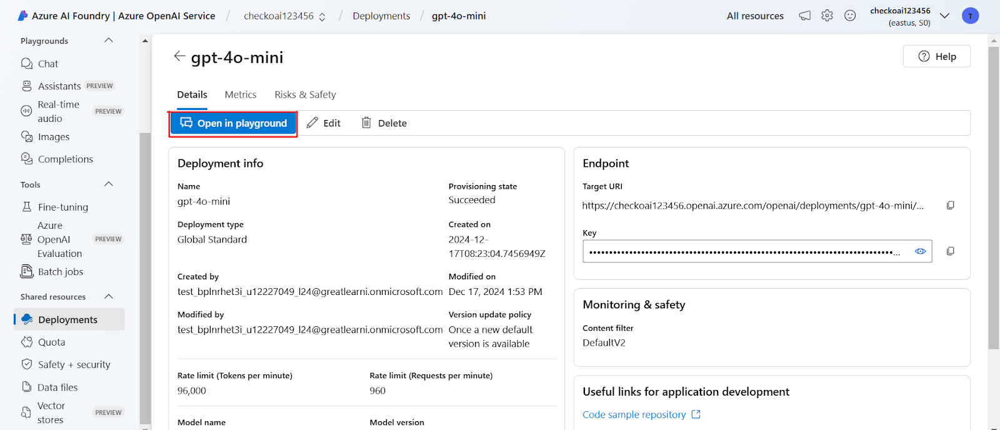

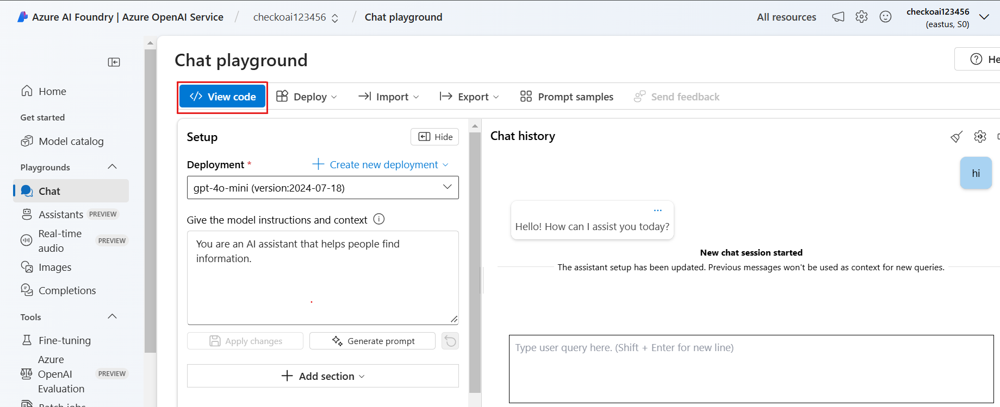

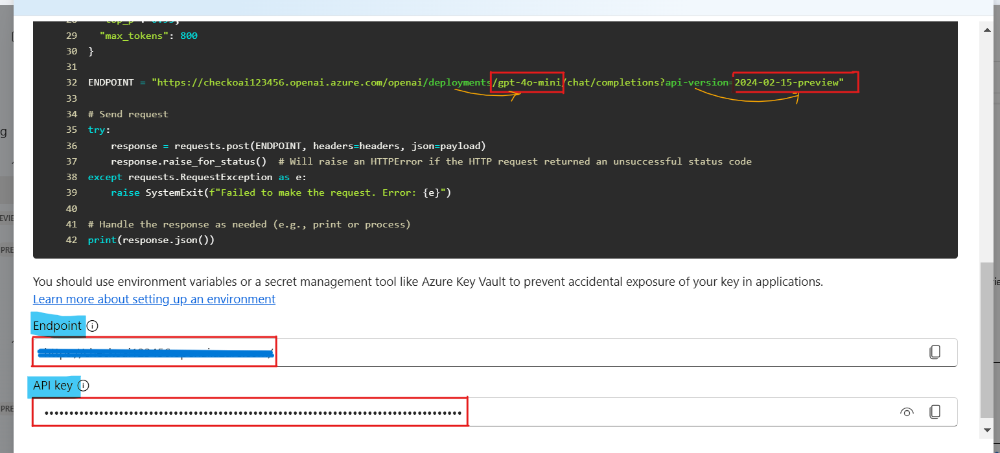

#### **Get Dall-e3 Endpoint**

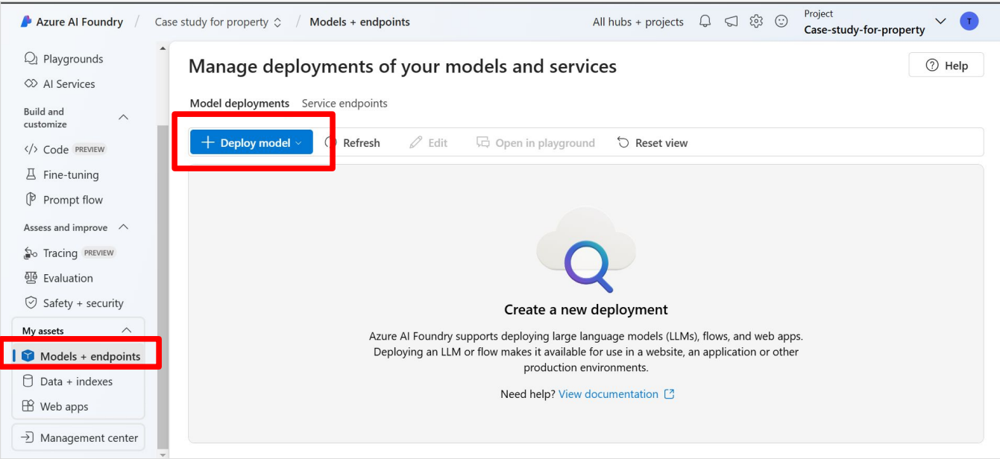

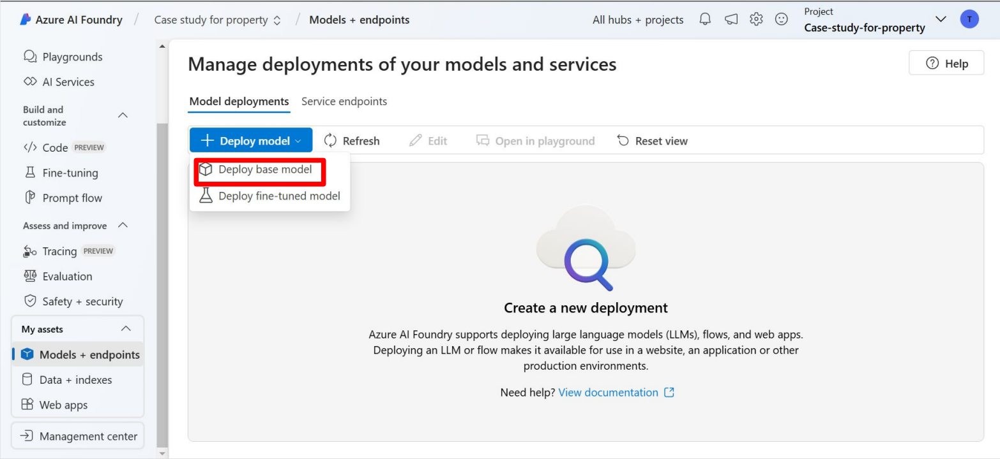

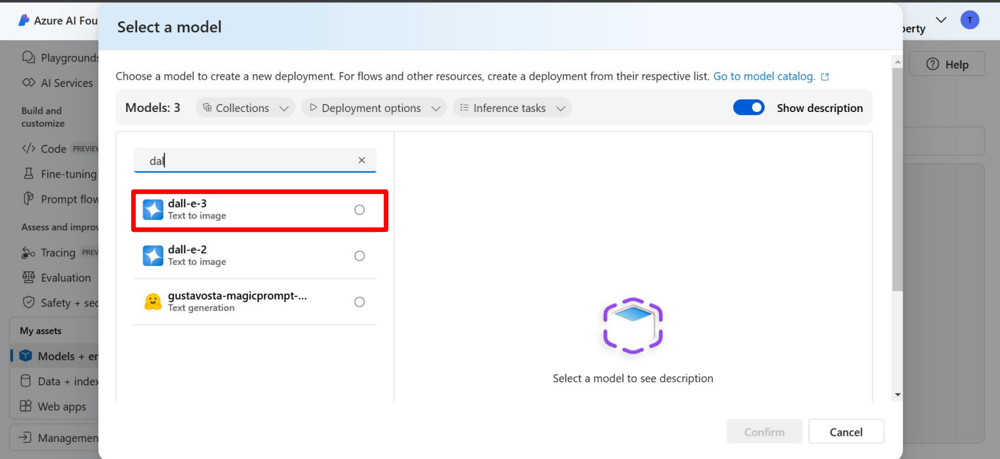

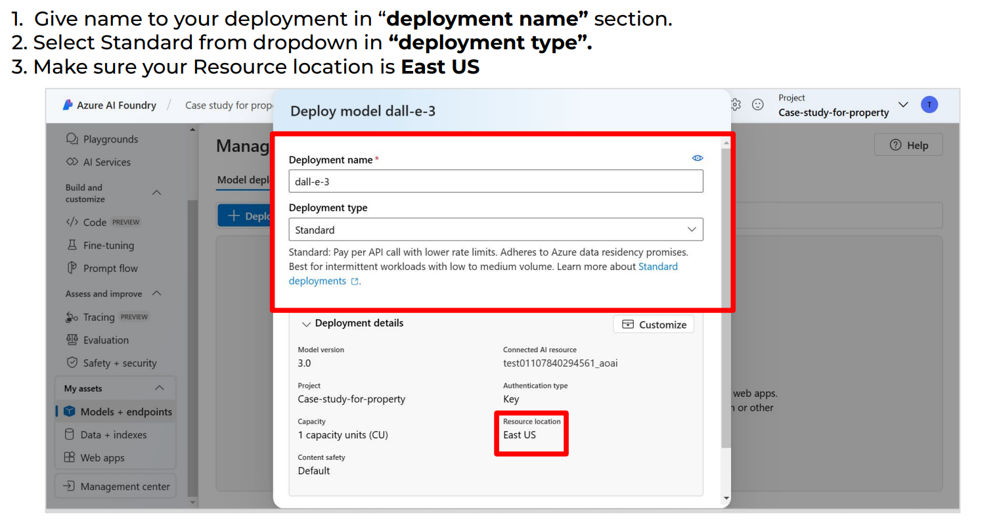

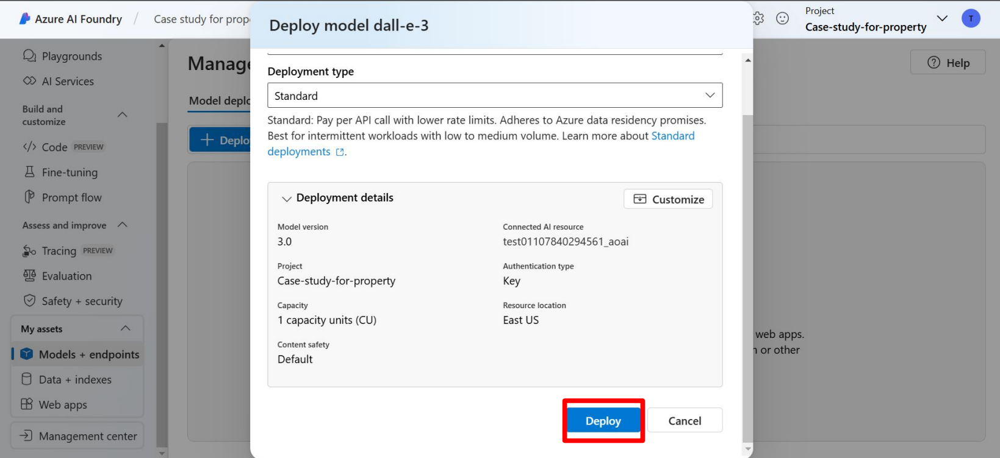

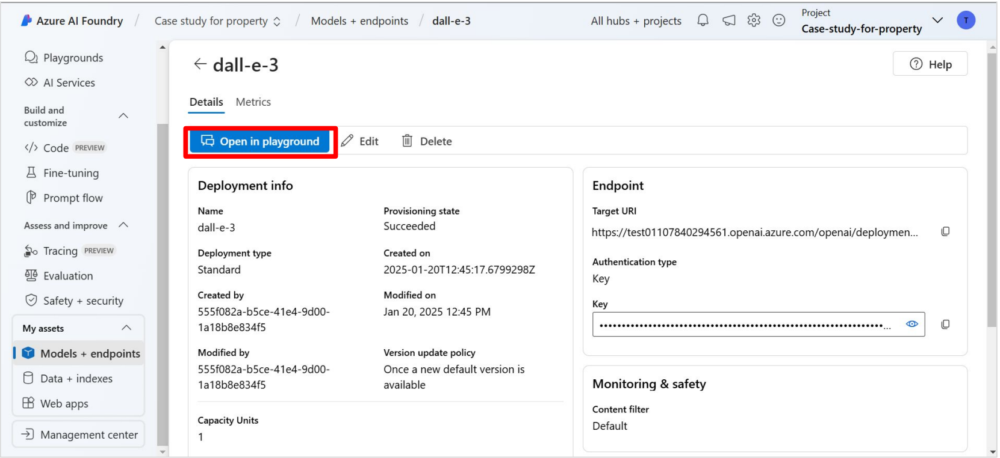

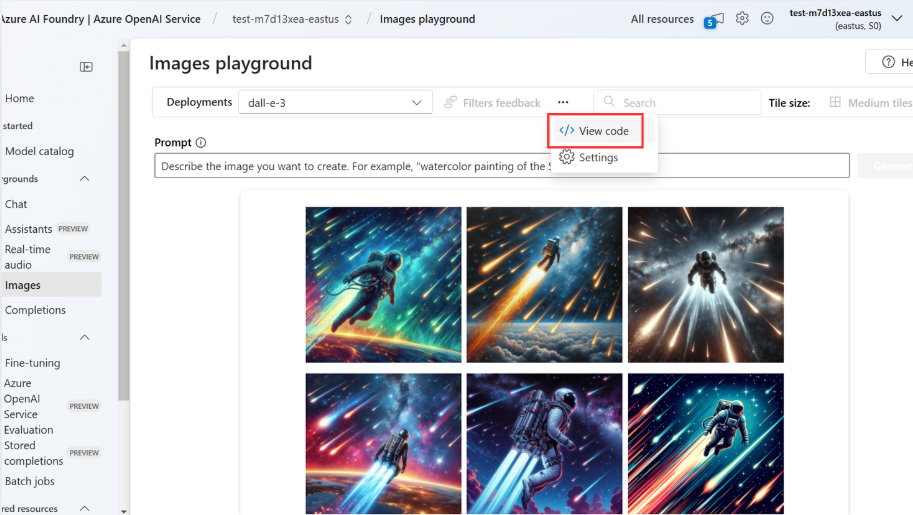

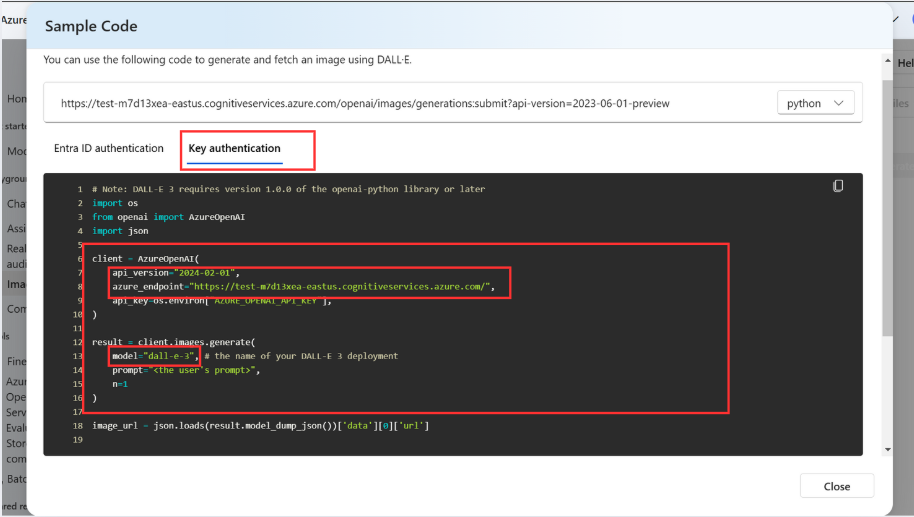

#### **Get Whisper endpoint**

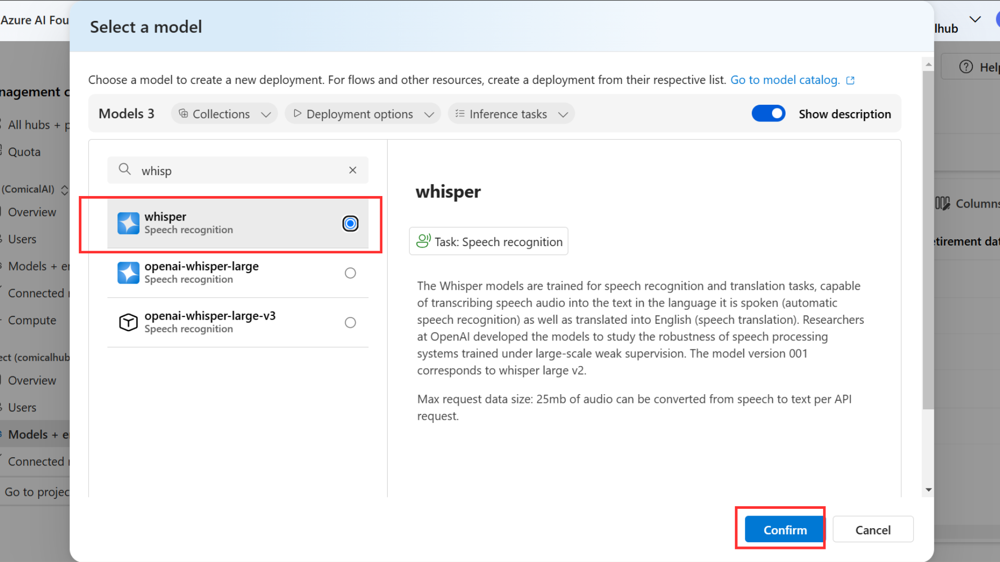

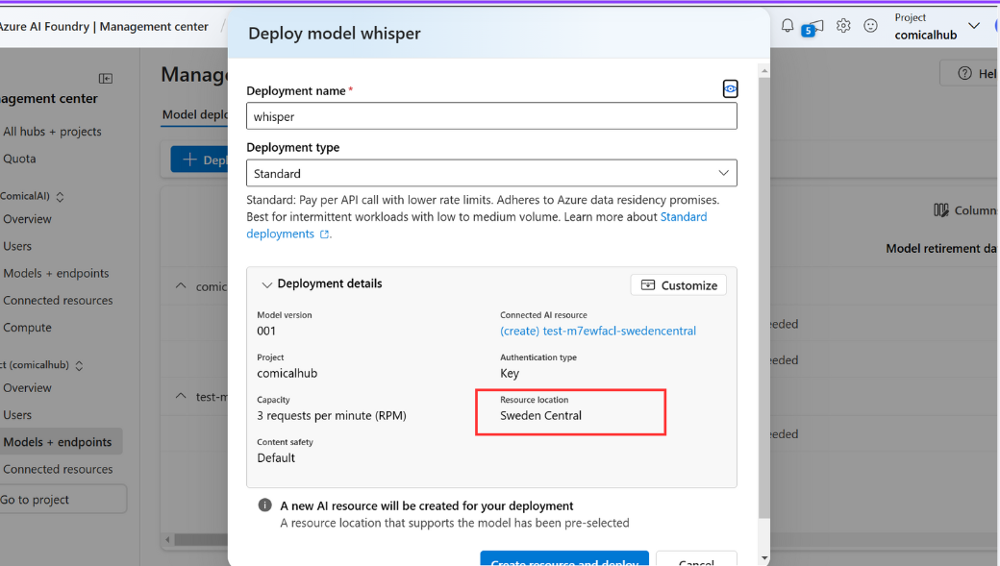

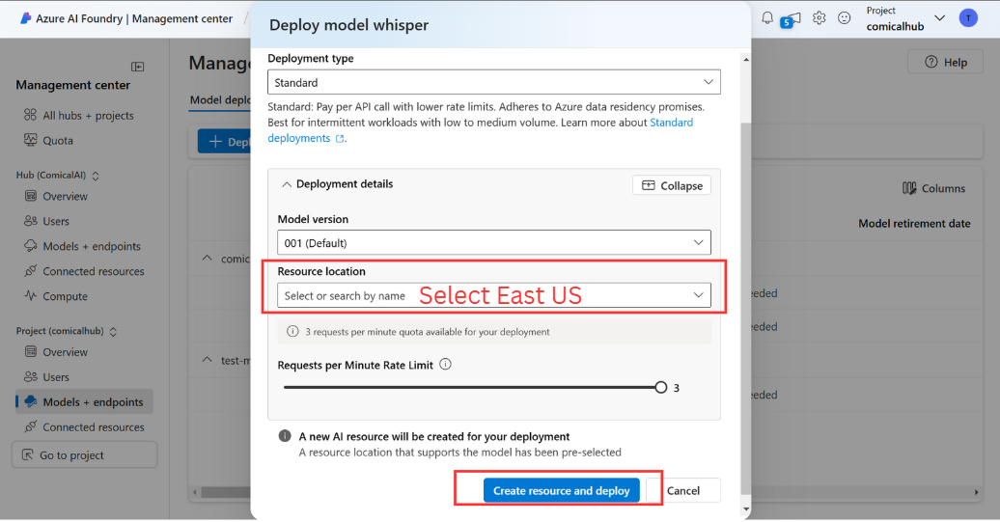

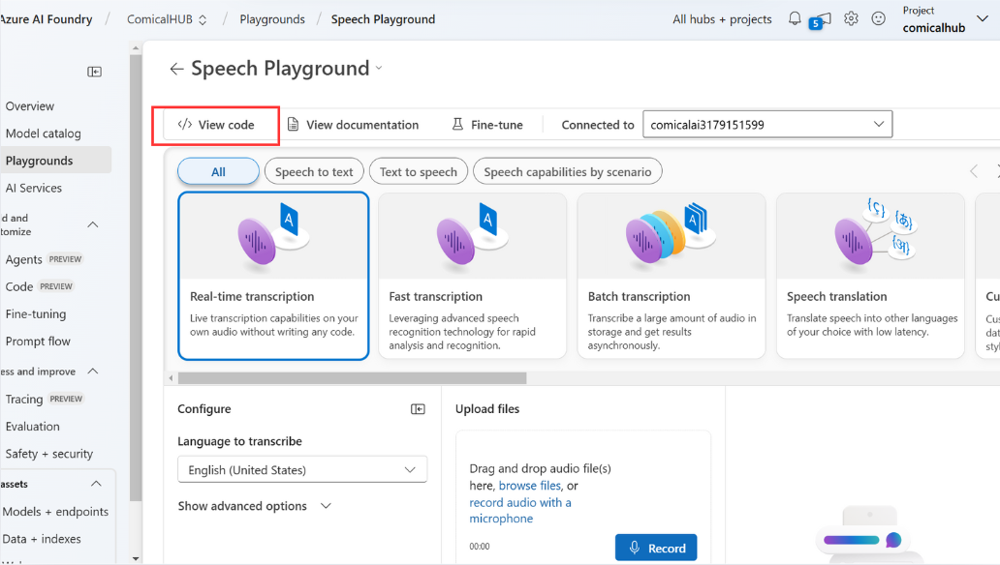

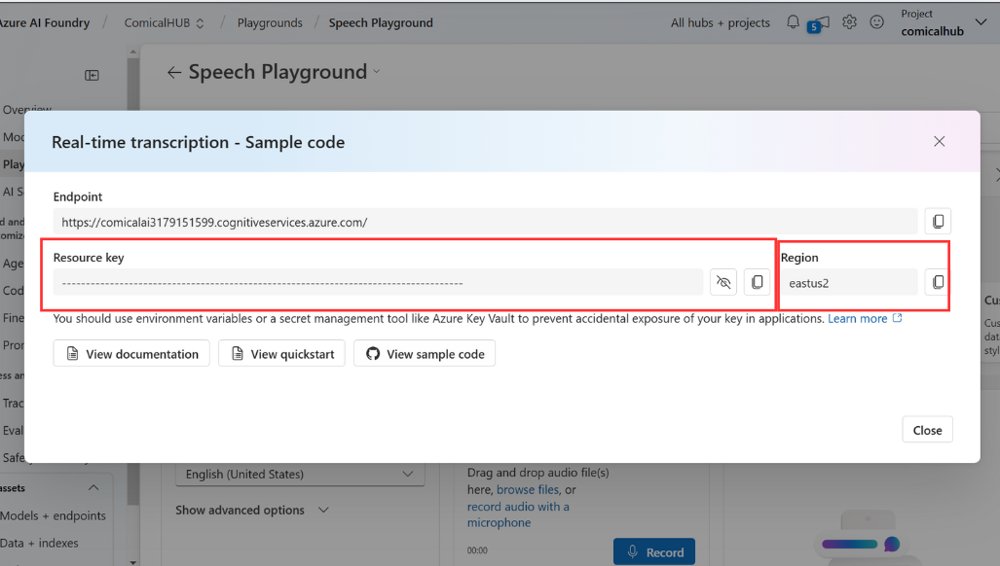

**Requirements: JSON Configuration Files**

To set up the system, you need to create two JSON configuration files with the following fields:

1. **/content/config(OpeanAI).json**
```json
{
  "AZURE_OPENAI_ENDPOINT": "your_openai_endpoint_here",
  "AZURE_OPENAI_KEY": "your_openai_api_key_here",
  "AZURE_OPENAI_APIVERSION": "your_openai_api_version_here",
  "CHATGPT_MODEL": "your_chatgpt_model_here"
}

2.  **/content/config(Audio&Image).json**
```json
{
  "SPEECH_KEY": "your_speech_api_key_here",
  "SPEECH_REGION": "your_speech_region_here",
  
  "AZURE_OPENAI_ENDPOINT": "your_image_openai_endpoint_here",
  "AZURE_OPENAI_API_KEY": "your_image_openai_api_key_here",
  "AZURE_OPENAI_APIVERSION": "your_image_openai_api_version_here",
  "OPEN_AI_MODEL": "your_image_model_here"
}


```

### Step 1: Get the Audio data

#### Step 1.1: Download the MP3 file

**Purpose:** To download an MP3 audio file from a specific URL and save it locally as "audio.mp3".

**Functionality:**

  * Retrieves the audio file: It fetches the MP3 file from the provided URL using the requests library.
  * Creates a local file: It prepares a new file named "audio.mp3" on your computer to store the downloaded audio.
  * Writes the audio data: It transfers the contents of the downloaded MP3 file into the newly created local file.
  * Saves the file: It ensures the "audio.mp3" file is properly saved to your computer's storage.

In [ ]:
# Download the MP3 file
url = "https://audio.guim.co.uk/2025/02/17-49392-gfw170225.mp3"
mp3_file = "audio.mp3"

response = requests.get(url)
with open(mp3_file, 'wb') as file:
    file.write(response.content)

#### Step 1.2: Convert MP3 to WAV

**Purpose:** To convert an MP3 audio file to a WAV audio file.

**Functionality:**

  * Reads the MP3 file.
  * Converts the audio data to WAV format.
  * Saves the converted audio to a new WAV file.
  * Informs the user of the successful conversion and file name.

In [ ]:
# Convert MP3 to WAV
audio = AudioSegment.from_mp3(mp3_file)
wav_file = "audio.wav"
audio.export(wav_file, format="wav")

# Inform the user that the WAV file has been created
print(f"File converted and saved as {wav_file}")

File converted and saved as audio.wav


#### Step 1.3: Compressing the WAV File

**Purpose:** The primary purpose of this code is to compress a WAV audio file to reduce its size. This is achieved by reducing the sample rate and bit depth of the audio data, resulting in a smaller file while still retaining the essential audio information.

**Functionality:**

  * Initialization: The variable compressed_wav_file is assigned the name "compressed_audio.wav," indicating the intended file name for the compressed audio output.

  * Sample Rate Reduction: The set_frame_rate(22050) function is called on the audio object. This reduces the audio's sample rate to 22050 Hz.

  Impact: Reducing the sample rate decreases the number of audio samples captured per second, which directly reduces the file size.

  * Bit Depth Reduction: The set_sample_width(1) function is applied to the audio object.
  This sets the bit depth to 1 byte, equivalent to 8 bits.

  Impact: Lowering the bit depth reduces the dynamic range of the audio, meaning fewer bits are used to represent each audio sample, leading to further file size reduction.

  * Exporting the Compressed Audio: The export() function is called on the audio object, with the specified file name (compressed_wav_file) and format ("wav").
  This saves the modified audio data (with reduced sample rate and bit depth) as a new WAV file named "compressed_audio.wav."

  * User Notification: The print() function displays a message to the console, informing the user that the compressed WAV file has been created and specifying its file name ("compressed_audio.wav").

This code takes an existing WAV audio file, reduces its size by lowering the sample rate and bit depth, and then saves the compressed audio as a new WAV file. This compression process makes the audio file smaller for storage or transmission purposes without significantly impacting the perceived audio quality.

In [ ]:
# Reduce sample rate and bit depth to compress the WAV file
compressed_wav_file = "compressed_audio.wav"

# Reduce the sample rate (e.g., from 44.1kHz to 22.05kHz)
audio = audio.set_frame_rate(22050)

# Reduce bit depth (e.g., from 16-bit to 8-bit)
audio = audio.set_sample_width(1)  # 1 byte = 8 bits (8-bit depth)

# Export the compressed WAV file
audio.export(compressed_wav_file, format="wav")

# Inform the user that the compressed WAV file has been created
print(f"Compressed WAV file saved as {compressed_wav_file}")

Compressed WAV file saved as compressed_audio.wav


#### Step 1.4: Delete Original and Uncompressed Audio

The code is to delete two files:

  * The original MP3 audio file that was downloaded.
  * The intermediate, uncompressed WAV file that was created during the conversion process.

This is achieved using the os.remove() function in Python, which removes files from the computer's storage.

The main reason for deleting these files is disk space management and workflow optimization.

In [ ]:
# Delete the MP3 and converted WAV file after compression is done
os.remove(mp3_file)
os.remove(wav_file)

### Step 2: Audio to Text Conversion

#### Step 2.1: Loading Configuration for Whisper

This step load configuration data from a JSON file.

  * Open the file: with open(...) opens the 'config(Audio&Image).json' file in read mode.
  * Read the content: WD_creds.read() reads the entire file content and stores it in the data variable.
  * Convert to a dictionary: json.loads(data) transforms the JSON content into a Python dictionary for easier use and assigns it to WD_creds.

In [ ]:
with open('/content/config(Audio&Image).json', 'r') as WD_creds:
    data = WD_creds.read()

WD_creds = json.loads(data)

#### Step 2.2: configure access to Azure's Speech-to-Text service

* speech_config = speechsdk.SpeechConfig(...): Creates a configuration object to store settings.
* subscription: Provides your unique Azure subscription key for authentication.
* region: Specifies the Azure region for optimal performance.

In [ ]:
speech_config = speechsdk.SpeechConfig(
    subscription=WD_creds["SPEECH_KEY"],  # Get key directly form json
    region=WD_creds["SPEECH_REGION"]      # Get region directly from json
)

#### Step 2.3: Trimming the Audio audio file at the start and end (if required)

**1. User Input:**
  * Prompts the user to enter the start and end times for trimming in minutes:seconds format.
  * Stores the input in start_time and end_time variables.

**2. Time Conversion:**
  * Splits start_time and end_time strings using the colon (:) as a delimiter.
  * Converts the split strings (minutes, seconds) to integers.
  * Calculates the start and end times in milliseconds and stores them in start_ms and end_ms.

**3. Audio Processing:**
  * Loads the audio file specified by compressed_wav_file using AudioSegment.
  * Defines the output file name as trimmed_audio.wav.
  * Extracts the audio segment between start_ms and end_ms milliseconds.
  * Exports the trimmed audio to the output file in WAV format.

**4. File Management:**
  * Deletes the original compressed WAV file (compressed_wav_file) using os.remove().

**5. Print File name:**
  * Prints a message to the console informing the user that the trimmed audio has been saved and providing the output file name.

In [ ]:
# Get user input for start and end time
start_time = input("Enter start time (min:sec) (e.g., 01:30): ")
end_time = input("Enter end time (min:sec) (e.g., 10:10): ")

# Convert start_time to milliseconds
start_minutes, start_seconds = map(int, start_time.split(":"))
start_ms = (start_minutes * 60 + start_seconds) * 1000

# Convert end_time to milliseconds
end_minutes, end_seconds = map(int, end_time.split(":"))
end_ms = (end_minutes * 60 + end_seconds) * 1000

# Load audio (assuming compressed_wav_file is defined earlier)
audio = AudioSegment.from_wav(compressed_wav_file)

# Define output file name
output_path = "trimmed_audio.wav"

# Trim and export
trimmed_audio = audio[start_ms:end_ms]
trimmed_audio.export(output_path, format="wav")
os.remove(compressed_wav_file)

print(f"Trimmed audio saved as {output_path}")

#### Steps 2.4: Function to Convert Audio to Text using Whisper

**1. Function Definition:**
  * Defines a function called transcribe_audio that takes the audio file path and the output text file path as input.
  * The output text file path has a default value of "transcription.txt".

**2. Speech Recognizer Setup:**
  * Configures the Azure Speech Recognizer using the provided audio file path and necessary configurations from the speechsdk library.

**3. Transcription Initialization:**
  * Creates an empty string called full_transcription to store the transcribed text as it is generated.

**4. Transcription Loop:**
  * Enters a while True loop to process the audio file segment by segment.
  * Attempts to recognize speech in each audio segment using speech_recognizer.recognize_once_async().get().

**5. Handling Recognition Results:**
  * Recognized Speech: If speech is recognized, the transcribed text is appended to the full_transcription string.
  * No Match: If no speech is detected in the segment, the loop continues to the next segment.
  * Cancellation: If the speech recognition process is canceled, the loop breaks and the function exits.
  * End of Audio: If no more text is recognized (indicating the end of the audio file), the loop breaks.

**6. Saving the Transcription:**

  * Opens the specified output text file in write mode ("w").
  * Writes the complete full_transcription to the file, removing any leading or trailing whitespace.

**7. Confirmation Message:**

  * Prints a message to the console confirming that the transcription has been saved and providing the path to the output text file.

In [ ]:
def transcribe_audio(audio_file_path, output_text_file="transcription.txt"):
    # Configure Speech Recognizer
    audio_config = speechsdk.audio.AudioConfig(filename=audio_file_path)
    speech_recognizer = speechsdk.SpeechRecognizer(speech_config=speech_config, audio_config=audio_config)

    # Store the full transcription
    full_transcription = ""

    print(f"Transcribing audio file: {audio_file_path}...\n")

    while True:
        # Recognize a segment of the audio
        result = speech_recognizer.recognize_once_async().get()

        if result.reason == speechsdk.ResultReason.RecognizedSpeech:
            print("Recognized:", result.text)
            full_transcription += result.text + " "

        elif result.reason == speechsdk.ResultReason.NoMatch:
            print("No speech detected, continuing...")
            continue  # Skip silence or noise and keep processing

        elif result.reason == speechsdk.ResultReason.Canceled:
            print("Speech recognition canceled:", result.cancellation_details.reason)
            break  # Stop if canceled

        # Stop when we reach the end of the file (no more recognized text)
        if not result.text:
            break

    # Save transcription to a text file
    with open(output_text_file, "w") as file:
        file.write(full_transcription.strip())

    print(f"\nFull transcription saved to {output_text_file}")

#### Step 2.5: Calling the Transcription Function

In [ ]:
# Path to the trimmed audio file
trimmed_audio_path = "/content/trimmed_audio.wav"

# Transcribe and save the output
transcribe_audio(trimmed_audio_path)


Transcribing audio file: /content/trimmed_audio.wav...

Recognized: This off, it's going to be 15th or 13th or 17th or whatever. They won't go down. But that is more sensible than just trying to come 11th or 9th and play with the back four and not impose this system on the team. I think Andrew Poster Coglou touched on this actually before the match because he said Amarin needs time. And I think Amarim maybe believes he's going to get time because of where they are in the table. And also I think it's that's exactly what he's doing. I think he's playing this system over and over again to find out.
Recognized: About his players and the character, their mentality. I actually thought yesterday, Bruno Fernandez, the work he got through and what he was being asked to do was quite, was quite immense really. He put in an incredible shift. He was blowing out of his proverbial a lot of the game, but he was working hard. He had the most crosses in the game. He had the most touches in the game. Tha

### Step 3: Text Summarization using 4o-mini

#### Step 3.1: Loading Configuration for 4o-mini

This step load configuration data from a JSON file.
  * Opens: Opens the config(OpeanAI).json file in read mode.
  * Reads: Reads the entire content of the file and stores it in a variable called data.
  * Converts: Converts the JSON data stored in data into a Python dictionary.
  * Stores: Assigns the resulting dictionary to the variable AZ_creds for later access to the configuration settings.

In [ ]:
with open('/content/config(OpeanAI).json', 'r') as AZ_creds:
    data = AZ_creds.read()

AZ_creds = json.loads(data)

#### Step 3.2: configure access to Azure's OpeanAI 4o-mini service

* Connects to Azure OpenAI: It establishes a connection to Microsoft's Azure OpenAI service.
* client is your messenger: It creates a tool called client that lets you communicate with Azure OpenAI.
* Provides the address: It tells client where the Azure OpenAI service is located using an endpoint URL stored in AZ_creds.
* Provides the key: It gives client an API key for authentication and access, also from AZ_creds.
* Sets the version: It specifies the API version to ensure compatibility, again using AZ_creds

In [ ]:
client = AzureOpenAI(
    azure_endpoint=AZ_creds["AZURE_OPENAI_ENDPOINT"],
    api_key=AZ_creds["AZURE_OPENAI_KEY"],
    api_version=AZ_creds["AZURE_OPENAI_APIVERSION"]
)

In [ ]:
deployment_name = AZ_creds["CHATGPT_MODEL"]

#### Step 3.3: Load the transcription text and Token Count

The main purpose of this step is to determine the number of tokens present in a given text (transcript). This is crucial for working with language models like GPT-4, which have limitations on the number of tokens they can process in a single request.

**Functionality:**

  * Encoding Selection: It chooses a specific encoding method from the tiktoken library, designed for the "gpt-4" model. This method defines how the text will be broken down into tokens.
  * Tokenization: It applies the selected encoding to the transcript, dividing it into individual tokens.
  * Token Counting: It calculates the total number of tokens generated from the transcript.
  * Output: It displays the calculated token count to the user.

In [ ]:
# Load the transcription text from file
with open("/content/transcription.txt", "r") as f:
    transcript = f.read()

In [ ]:
# Tokenize the transcript and count tokens
encoding = tiktoken.encoding_for_model("gpt-4")
token_count = len(encoding.encode(transcript))

print(f"Token count: {token_count}")

Token count: 1750


#### Step 3.4: Zero-Shot Prompting

Zero-shot prompting is a technique that uses LLMs' generalization capabilities to attempt new tasks without prior specific training or examples. It uses LLMs' extensive pre-training on large and diverse datasets, enabling them to apply their broad knowledge to new tasks based solely on clear and concise instructions
  * This step provides detailed instructions to the AI model.
  * These instructions guide the AI to transform news transcripts into humorous comic-style illustrations and news articles.
  * The instructions emphasize humor, exaggeration, and ethical considerations.
  * Also specifies the desired output format and the relationship between the outputs.

In [ ]:
# Define the system message for Image generation prompt and new article from the transcript
zero_shot_system_message = """
You are an advanced AI specializing in converting news transcripts into engaging, humorous, and visually compelling comic-style illustrations. Your task is to generate a meme-worthy, exaggerated visual representation while maintaining factual accuracy and coherence with a humorous article utilizing the podcast transcript.

For every news transcript:
- Extract the key subject, event, and humorous aspects.
- Convert serious elements into an exaggerated, cartoonish format with expressive characters and dynamic poses.
- Ensure the image and article align in tone, humor, and theme.
- Use a vibrant comic-style approach suitable for social media virality.
- Maintain ethical and responsible content generation.

**Output Format:**
1. **image_generation_prompt** – A detailed, lively, and humor-infused prompt for AI image generation.
2. **news_article** – A witty, engaging, and exaggerated news article with humor, satire, and pop culture references. The article must always include a title but don't mention "Title:" just add bold styling for it.

Both outputs must complement each other, ensuring consistency in storytelling and comedic exaggeration.

"""

**Purpose:** The primary purpose of the zero_shot function is to generate creative content (an image generation prompt and a news article) from a audio transcript using 4o-mini and zero-shot prompting.

It acts as a bridge between the transcribed news audio and the AI's creative capabilities. By providing carefully crafted instructions (the system_message) and the transcript, it guides the AI to generate engaging and humorous outputs that can be used to create a comic-style illustration and a satirical news article.

**Functionality:**
* Receive Input:
  The function takes two inputs:
    * transcript: The text content transcribed from the audio news source.
    * system_message: A detailed set of instructions that guides the AI's behavior and output format.

* Prepare the Prompt:
  Structure the input data into a format suitable for the language model. This involves creating a message with "system" and "user" roles, where the "system" role provides instructions, and the "user" role provides the transcript.

* Interact with the AI Model:
  It communicates with the designated language model (specified by deployment_name) using the client.chat.completions.create method. This sends the structured prompt to the AI.

* Retrieve the Response:
  Retrieve the AI's generated content from the response. This content includes an image_generation_prompt and a news_article, extracted using regular expressions.

* Handling Errors:
  The function includes error handling using try and except blocks. If there's an issue during the interaction with the AI, it prints an error message and returns an empty string.

* Return Output:
  Finally, return the AI-generated content, which is then used in subsequent steps for image generation and news article creation.

In [ ]:
# Function for zero-shot prompting using an LLM
def zero_shot(transcript, system_message):
    # Creating a message structure for the LLM with system and user messages
    message = [
        {"role": "system", "content": system_message},  # System message to set the model's behavior
        {"role": "user", "content": transcript}  # User input (transcript) to be processed
    ]

    try:
        # Get the chat completion response from the language model
        response = client.chat.completions.create(
            model=deployment_name,  # Specifies the model to use
            messages=message,  # Passes the constructed message list
            temperature=0.5  # Controls randomness; lower values ensure more deterministic responses
        )

        # Extracting the model's response (prompt) from the API output
        prompt = response.choices[0].message.content

    except Exception as e:
        # Handles any exceptions that occur during API calls
        print(f"Error: {e}")  # Prints the error message for debugging
        prompt = ""  # Returns an empty string in case of failure

    return prompt  # Returns the generated response


* call_zero_shot = zero_shot(transcript, zero_shot_system_message): This line calls the zero_shot function, which is designed to interact with a Large Language Model (LLM). It passes the transcript (text from the audio) and zero_shot_system_message (instructions for the LLM) as input. The function's output is stored in the call_zero_shot variable.
* print(call_zero_shot): This line simply prints the output generated by the zero_shot function to the console. This output is expected to contain an image generation prompt and a news article, as instructed in the zero_shot_system_message.

In [ ]:
# Generate the image_generation_prompt and news_article
call_zero_shot = zero_shot(transcript, zero_shot_system_message)
print(call_zero_shot)

1. **image_generation_prompt** – Create a vibrant comic-style illustration depicting a dramatic chess showdown between two exaggerated characters: D. Gukesh, a young Indian chess prodigy with a superhero cape and an oversized chess piece as a shield, and Ding Liren, the seasoned champion with a wizard hat and a magical chessboard. Gukesh should be striking a heroic pose, triumphantly holding a giant trophy with "Youngest World Champion" inscribed on it, while Ding looks comically shocked, with chess pieces flying around him. The background should feature a whimsical chess arena filled with cheering cartoon fans, and speech bubbles capturing their banter about the intense match.

2. **news_article** – **Gukesh's Grandmastery: The Youngest Chess Champion in History!**  

In a turn of events that could only be described as a chess fairy tale, D. Gukesh, the 18-year-old chess wizard from India, has officially outmaneuvered the seasoned sorcerer of strategy, Ding Liren, to become the younge

#### Step 3.5: Regex-Based Text Extraction from the response

The re module is used for pattern matching and extracting specific text from a string.

* Extracting the Image Generation Prompt
  * A regular expression (re.search) is used to find text that follows the pattern **image_generation_prompt** – and ends before two newlines (\n\n).
  * The re.DOTALL flag allows matching across multiple lines.
  *If a match is found, the extracted text is stripped of leading and trailing spaces.

* Extracting the News Article

  * Another regex pattern is used to find text following **news_article**, capturing everything until the end of the input.
  * The re.DOTALL flag ensures multiline content is captured.
  * If a match is found, the extracted text is stripped of extra spaces.

* Handling Missing Matches

  If no match is found for either the image generation prompt or the news article, an empty string is assigned to ensure the program does not break.

In [ ]:
# Using regex to extract the image generation prompt from the response
image_generation_prompt_match = re.search(
    r'\*\*image_generation_prompt\*\* – (.*?)\n\n',  # Pattern to find the image generation prompt
    call_zero_shot,  # The input text containing the structured response
    re.DOTALL  # Enables matching across multiple lines
)

# Using regex to extract the news article from the response
news_article_match = re.search(
    r'\*\*news_article\*\*\s*(.*?)$',  # Pattern to find the news article content
    call_zero_shot,  # The input text containing the structured response
    re.DOTALL  # Enables matching across multiple lines
)

# Extract the matched image generation prompt, if found; otherwise, return an empty string
image_generation_prompt = image_generation_prompt_match.group(1).strip() if image_generation_prompt_match else ""

# Extract the matched news article, if found; otherwise, return an empty string
news_article = news_article_match.group(1).strip() if news_article_match else ""


In [ ]:
print(image_generation_prompt)

Create a vibrant comic-style illustration depicting a dramatic chess showdown between two exaggerated characters: D. Gukesh, a young Indian chess prodigy with a superhero cape and an oversized chess piece as a shield, and Ding Liren, the seasoned champion with a wizard hat and a magical chessboard. Gukesh should be striking a heroic pose, triumphantly holding a giant trophy with "Youngest World Champion" inscribed on it, while Ding looks comically shocked, with chess pieces flying around him. The background should feature a whimsical chess arena filled with cheering cartoon fans, and speech bubbles capturing their banter about the intense match.


In [ ]:
print(news_article)

– **Gukesh's Grandmastery: The Youngest Chess Champion in History!**  

In a turn of events that could only be described as a chess fairy tale, D. Gukesh, the 18-year-old chess wizard from India, has officially outmaneuvered the seasoned sorcerer of strategy, Ding Liren, to become the youngest World Chess Champion in history! After 13 games filled with more draws than a kindergarten art class, the grand finale was anything but dull. 

Picture this: Gukesh, with the confidence of a superhero, entered the final game armed with nothing but his trusty knight and an insatiable hunger for victory. Meanwhile, Ding, the reigning champion, was ready to defend his title like a dragon guarding its treasure, but alas, even dragons can have off days! 

As the clock ticked down, viewers were on the edge of their seats, watching Gukesh capitalize on a blunder from Ding, who, in a moment of sheer shock, probably thought he was playing checkers instead of chess! With a triumphant checkmate, Gukesh not 

### Step 4: Image generation using Dall-e3

#### Step 4.1: Step 3.2: configure access to Dall-e3 service

In [ ]:
# Initializing an Azure OpenAI client instance
client_DE = AzureOpenAI(
    azure_endpoint=WD_creds["AZURE_OPENAI_ENDPOINT"],  # The endpoint URL for Azure OpenAI service
    api_key=WD_creds["AZURE_OPENAI_API_KEY"],  # The API key required for authentication
    api_version=WD_creds["AZURE_OPENAI_APIVERSION"]  # The API version being used
)


In [ ]:
deployment_name = WD_creds["OPEN_AI_MODEL"] # The model being used

#### Step 4.2: Function for Image Generation and Display using Dall-e3

* Generate an AI Image:
  * Calls the client_DE.images.generate function with a text prompt to create an image using the specified AI model.
  * Requests a single (n=1) image to be generated.

* Set Up Storage Directory:
  * Defines an images folder in the current directory.
  * Checks if the folder exists; if not, creates it.

* Define Image Path:
  * Specifies the filename and location where the generated image will be saved.

* Download the Image:
  * Extracts the image URL from the API response.
  * Uses httpx.get() to download the image content in binary format.

* Save the Image Locally:
  * Opens the specified file in write-binary (wb) mode.
  * Writes the downloaded image content to the file.

* Open and Display the Image:
  * Loads the image using Image.open().
  Uses display(image) to show the image (especially useful in Jupyter Notebooks).

* Display the article as Markdown:
  * Uses display(Markdown(article)) to render and present the article in formatted text.

In [ ]:
def generate_and_display_image(image_prompt, article):
    # Generate an image using Azure OpenAI's image generation model
    result = client_DE.images.generate(
        model=deployment_name,  # Specifies the AI model to be used
        prompt=image_prompt,  # Provides a textual description for image generation
        n=1  # Requests a single image to be generated
    )

    # Set the directory for storing the generated image
    image_dir = os.path.join(os.curdir, 'images')  # Creates an 'images' folder in the current directory
    if not os.path.isdir(image_dir):
        os.mkdir(image_dir)  # Creates the directory if it does not exist

    # Define the path where the image will be saved
    image_path = os.path.join(image_dir, 'generated_image.png')

    # Retrieve the generated image from the model's response
    image_url = result.data[0].url  # Extracts the image URL from the API response
    generated_image = httpx.get(image_url).content  # Downloads the image content

    # Save the image locally in binary write mode
    with open(image_path, "wb") as image_file:
        image_file.write(generated_image)

    # Open and display the saved image
    image = Image.open(image_path)
    display(image)  # Displays the image in an interactive environment (Jupyter Notebook, etc.)

    # Display the provided article as a Markdown text
    display(Markdown(article))


#### Step 4.3: Executing AI Image Generation with News Context

* Calls the Function – Executes generate_and_display_image to generate an image using AI based on the given prompt.

* Provides Input – Passes image_generation_prompt (image description) and news_article as inputs.

* Displays Output – Generates, saves, and displays the AI-created image along with the news article for context

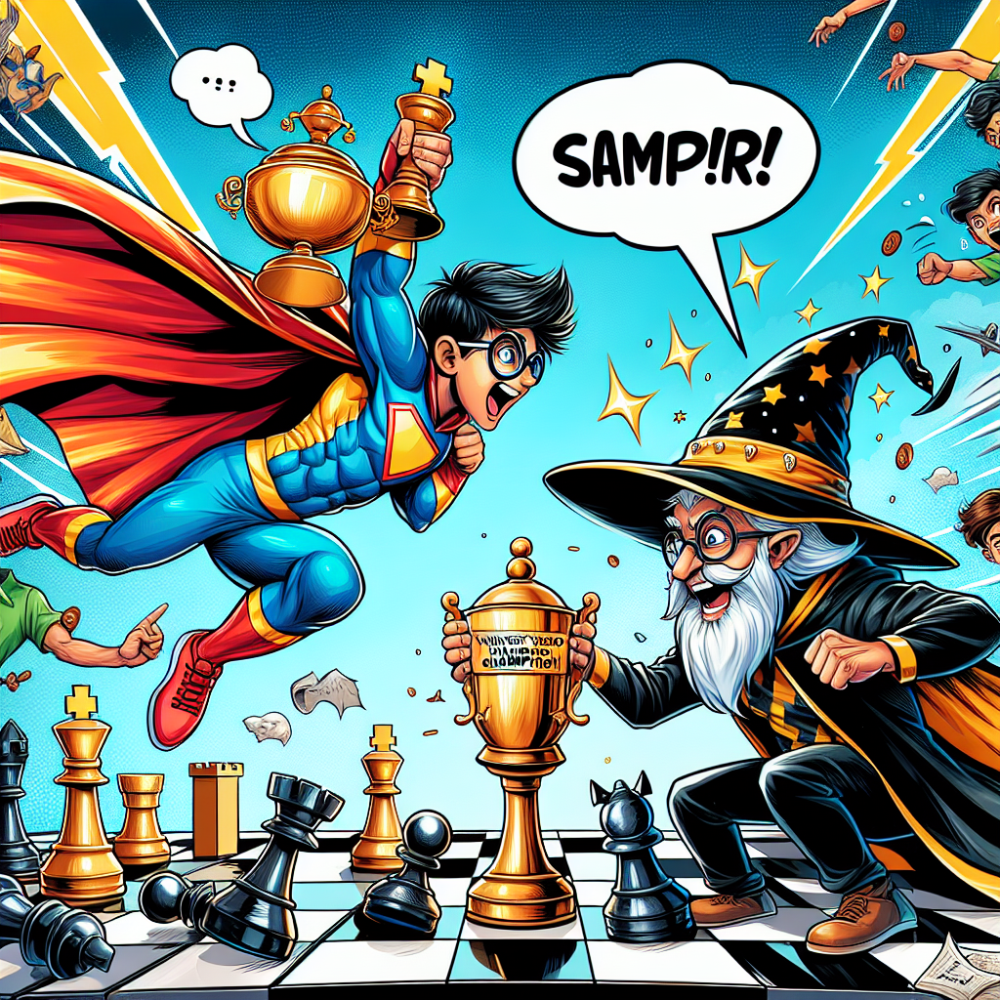

– **Gukesh's Grandmastery: The Youngest Chess Champion in History!**  

In a turn of events that could only be described as a chess fairy tale, D. Gukesh, the 18-year-old chess wizard from India, has officially outmaneuvered the seasoned sorcerer of strategy, Ding Liren, to become the youngest World Chess Champion in history! After 13 games filled with more draws than a kindergarten art class, the grand finale was anything but dull. 

Picture this: Gukesh, with the confidence of a superhero, entered the final game armed with nothing but his trusty knight and an insatiable hunger for victory. Meanwhile, Ding, the reigning champion, was ready to defend his title like a dragon guarding its treasure, but alas, even dragons can have off days! 

As the clock ticked down, viewers were on the edge of their seats, watching Gukesh capitalize on a blunder from Ding, who, in a moment of sheer shock, probably thought he was playing checkers instead of chess! With a triumphant checkmate, Gukesh not only secured the title but also sent shockwaves through the chess community, proving that age is just a number when you’ve got moves like a grandmaster.

In the aftermath, social media exploded with memes of Gukesh donning a crown made of chess pieces, while Ding was humorously portrayed as a confused wizard with his chessboard turned upside down. As fans celebrated, Gukesh was hailed as a prodigy, with even Susan Polgar, chess legend and commentator, declaring, “I told you so!” 

So, what’s next for our young champion? Maybe a superhero movie, or at the very least, a Netflix series titled “Gukesh: The Chess Avenger.” One thing’s for sure: the chess world will never be the same again!

In [ ]:
# Call the function to generate and display an AI-generated image based on the prompt and news article
generate_and_display_image(image_generation_prompt, news_article)
